# Restricted Boltzmann Machines: Bounded Continuous Visible Units Following Von Mises Distribution

## Abstract

This notebook implements and demonstrates Restricted Boltzmann Machines (RBMs) with bounded continuous visible units. RBMs are generative models that learn to represent data distributions through unsupervised learning. We explore training on datasets like XY Models, Wind direction, and dihedral angles of proteins using Contrastive Divergence (CD) and Persistent Contrastive Divergence (PCD) algorithms. 

## Authors

Kai Zhang and Sora Sakai, Department of Chemistry and Biochemistry, The University of Texas at Tyler, 2025

## References

 - SidechainNet: https://doi.org/10.1002/prot.26169, https://github.com/jonathanking/sidechainnet
 - Standard Meteorological 42503 dataset: https://www.ndbc.noaa.gov/faq/measdes.shtml, https://www.ndbc.noaa.gov/download_data.php?filename=42503e2023.txt.gz&dir=data/historical/drift/

## Optimal/Close-to-optimal Training Hyperparameters

| Dataset | Split| n_hidden | n_epochs | lr (learning rate) |  CD or PCD | $k$ (MC steps)| generation|
|:---------------:|:---------------:|:---------------:|:----------------:|:---------------:|:---------------:| :-----: |:---:|
| Dihedral Angles | training | 8 | 500 | 0.01 | PCD | 10 | Captures bimodal distribution well but a little skewed. |
| NDBC WDIR | training | 4 | 20 | 0.01 | PCD | 10 | Captures unimodal distribution. mse grows when overtrained. |
| XY | training | 1024 | 500 | 0.01 | PCD | 10 | Good Energy and Magnetization generation. For T = '0.6', Test E/N: -1.6681, gen E/N: -1.6447, Test C/N: 0.6368, gen C/N: 0.8769, Test M/N: 0.8034, gen M/N: 0.7987, Test Chi/N: 1.1911, gen Chi/N: 1.0392 |

In [263]:
import os
from os import path

import matplotlib.pyplot as plt
import os
import numpy as np
import pandas as pd
import math

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.distributions as D

from torchvision import datasets, transforms
from torch.utils.data import DataLoader

In [264]:
# Check PyTorch GPU availability and set device

print("PyTorch version:", torch.__version__)
print("CUDA available:", torch.cuda.is_available())
print("CUDA device count:", torch.cuda.device_count())

if torch.cuda.is_available():
    print("GPU device name:", torch.cuda.get_device_name(0))

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

PyTorch version: 2.11.0+cu130
CUDA available: True
CUDA device count: 1
GPU device name: NVIDIA GeForce RTX 4090


# 1. Datasets

In [265]:
# Define data directory path to where data is downloaded and/or stored.

data_dir = path.join("..", "data")

## 1.1 Load Dihedral Angle dataset
https://doi.org/10.1002/prot.26169, https://github.com/jonathanking/sidechainnet

Load protein dihedral angles from the Sidechainnet Dataset.

Train on data with 2 visible units.

In [119]:
import sidechainnet as scn

data = scn.load(casp_version=12, casp_thinning=30, scn_dir=path.join(data_dir, "sidechainnet_data"))

SidechainNet was loaded from ../data/sidechainnet_data/sidechainnet_casp12_30.pkl.


In [120]:
# Generate an array of phi and psi angles from the dataset of shape [M, 2], where M is the amount of residues considered.

row = 0
M = 200000

# Shuffle data
data_list = list(data)
np.random.shuffle(data_list)

data_array = [[], []]
for protein in data_list:
    if row >= M:
        break
    
    phi_angles = protein.angles[:, 0]
    psi_angles = protein.angles[:, 1]

    # Use mask to filter missing residues.
    mask = [True if c == '+' else False for c in protein.mask]
    phi_angles = phi_angles[mask]
    psi_angles = psi_angles[mask]

    # Ensure there are no nan values passed to the data array.
    # Search for indices where either one of phi or psi is nan.
    nan_indices = np.isnan(phi_angles) | np.isnan(psi_angles)
    phi_angles = phi_angles[~nan_indices]
    psi_angles = psi_angles[~nan_indices]

    data_array[0].extend(phi_angles)
    data_array[1].extend(psi_angles)

    row += len(phi_angles)

data_array = np.array(data_array).T

In [121]:
# Convert to Tensor and create data loaders.

# Split ratio between train_data and test_data
split = 0.8

dataset_tensor = torch.from_numpy(data_array).float()

dihedral_train, dihedral_test = torch.split(dataset_tensor, int(len(dataset_tensor) * split))

print(dihedral_train.shape)
print(dihedral_test.shape)

train_loader = DataLoader(dihedral_train, batch_size=512, shuffle=True, drop_last=False) # watch out PCD last batch size matching problem
test_loader = DataLoader(dihedral_test, batch_size=512, shuffle=True, drop_last=False) # # y = 0-9

torch.Size([160028, 2])
torch.Size([40007, 2])


In [122]:
# Git a batch and inspect shapes

X_batch = next(iter(test_loader))
print(X_batch.shape)

torch.Size([512, 2])


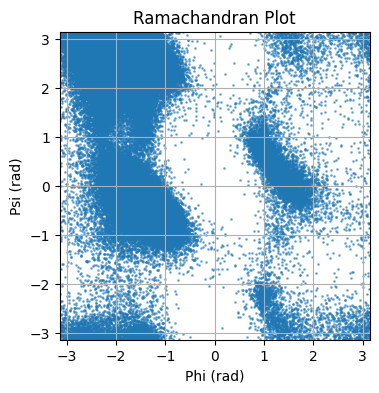

In [123]:
# See Ramchadran plots

phi = dataset_tensor[:, 0]
psi = dataset_tensor[:, 1]
plt.figure(figsize = (4, 4))
plt.scatter(phi, psi, alpha=0.5, s=1)
plt.xlim(-np.pi, np.pi)
plt.ylim(-np.pi, np.pi)
plt.xlabel("Phi (rad)")
plt.ylabel("Psi (rad)")
plt.title("Ramachandran Plot")
plt.grid(True)
plt.show()

Text(0.5, 1.0, 'Psi Distribution')

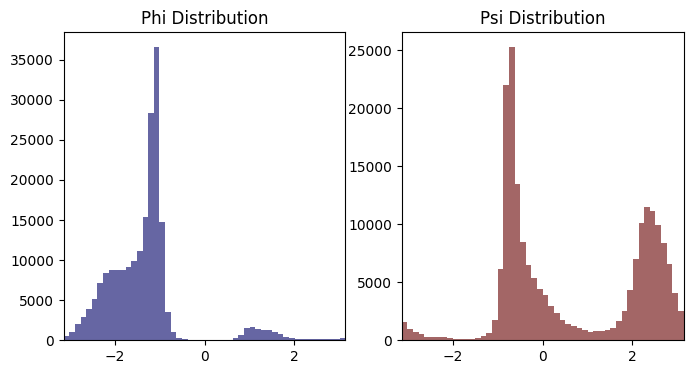

In [124]:
# See phi and psi distributions

fig, axes = plt.subplots(1, 2, figsize=((8, 4)))

ax_phi = axes[0]
ax_psi = axes[1]

ax_phi.hist(phi, bins=50, color=(0, 0, 0.4, 0.6))
ax_phi.set_xlim(-np.pi, np.pi)
ax_phi.set_title("Phi Distribution")

ax_psi.hist(psi, bins=50, color=(0.4, 0, 0, 0.6))
ax_psi.set_xlim(-np.pi, np.pi)
ax_psi.set_title("Psi Distribution")

Text(0.5, 1.0, 'Phi and Psi Distributions')

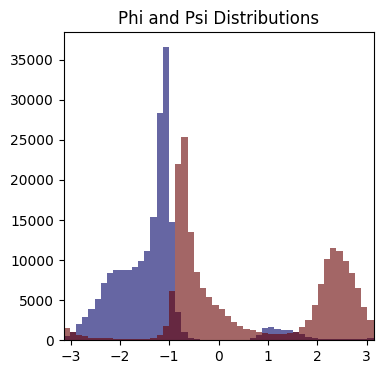

In [125]:
# See phi and psi distributions together

fig, ax = plt.subplots(1, 1, figsize = (4, 4))

ax.hist(phi, bins=50, color=(0, 0, 0.4, 0.6))
ax.hist(psi, bins=50, color=(0.4, 0, 0, 0.6))

ax.set_xlim(-np.pi, np.pi)
ax.set_title("Phi and Psi Distributions")

## 1.2 Load NDBC dataset

See https://www.ndbc.noaa.gov/faq/measdes.shtml for data format.

Download dataset from https://www.ndbc.noaa.gov/download_data.php?filename=42503e2023.txt.gz&dir=data/historical/drift/, and put it inside data_dir.

Train on data with 1 visible unit.

In [230]:
# Load the dataset from a text file with two header rows and whitespace as delimiter

file_path = os.path.join(data_dir, '42503e2023.txt')
dataset = pd.read_csv(file_path, sep='\s+', header=[0, 1])

print(dataset.shape)
dataset

(13782, 15)


<>:4: SyntaxWarning: invalid escape sequence '\s'
<>:4: SyntaxWarning: invalid escape sequence '\s'
/tmp/ipykernel_26343/4281887980.py:4: SyntaxWarning: invalid escape sequence '\s'
  dataset = pd.read_csv(file_path, sep='\s+', header=[0, 1])


,#YY,MM,DD,hhmm,LAT,LON,WDIR,WSPD,GST,PRES,ATMP,WTMP,DEWP,WVHT,DPD
,#yr,mo,dy,hrmn,deg,deg,degT,m/s,m/s,hPa,degC,degC,degC,m,sec
0,2022,8,29,1530,27.28,-83.86,138,5.7,6.8,1016.2,29.0,31.2,24.3,0.5,3
1,2022,8,29,1630,27.28,-83.87,251,3.9,4.6,1016.2,27.2,31.1,24.9,0.6,3
2,2022,8,29,1730,27.28,-83.88,236,5.0,5.5,1016.0,27.3,31.1,24.9,0.5,4
3,2022,8,29,1830,27.27,-83.88,219,3.4,3.8,1015.1,28.3,31.2,24.5,0.5,3
4,2022,8,29,1930,27.28,-83.88,222,1.2,1.6,1014.4,28.6,31.2,24.4,0.4,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13777,2022,12,3,1030,25.87,-86.03,90,6.5,7.2,1023.9,25.2,28.1,19.2,1.4,6
13778,2022,12,3,1130,25.87,-86.03,85,6.9,7.7,1024.3,25.2,28.0,19.1,1.4,8
13779,2022,12,3,1230,25.87,-86.03,88,5.8,6.5,1024.6,25.3,27.9,18.4,1.3,5


Text(0.5, 1.0, 'Wdir Distribution')

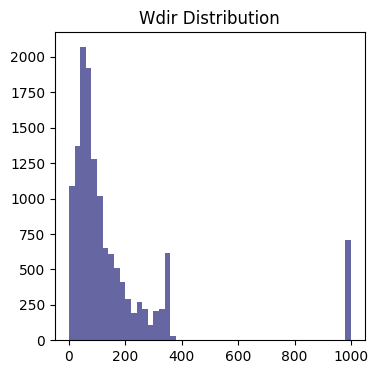

In [231]:
# Get wind direction and plot the histogram distribution

wdir = dataset.iloc[:, 6]
wdir = wdir.to_numpy()

fig, ax = plt.subplots(1, 1, figsize = (4, 4))

ax.hist(wdir, bins=50, color=(0, 0, 0.4, 0.6))
ax.set_title("Wdir Distribution")

In [232]:
# Remove missing values, represented by 999, then convert to radians

# remove outliers
wdir = wdir[wdir < 999]

# wrap and convert to rad
wdir = np.mod(wdir, 360)
wdir = np.deg2rad(wdir.astype(np.float32))
wdir.shape

(13074,)

Text(0.5, 1.0, 'Wdir Distribution')

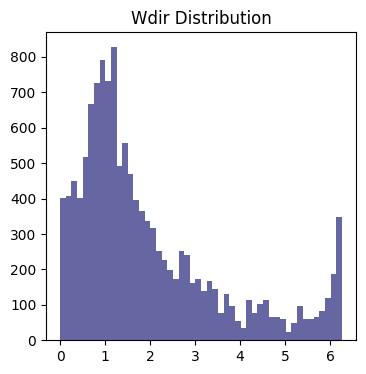

In [233]:
# Plot histogram distribution

fig, ax = plt.subplots(1, 1, figsize = (4, 4))

ax.hist(wdir, bins=50, color=(0, 0, 0.4, 0.6))
ax.set_title("Wdir Distribution")

In [234]:
# Convert to Tensor and create data loaders.

# Split ratio between train_data and test_data
split = 0.8

wdir_tensor = torch.from_numpy(wdir)
wdir_train, wdir_test = torch.split(wdir_tensor, int(len(wdir_tensor) * split))

print(wdir_train.shape)
print(wdir_test.shape)

train_loader = DataLoader(wdir_train, batch_size=64, shuffle=True, drop_last=False)
test_loader = DataLoader(wdir_test, batch_size=64, shuffle=True, drop_last=False)

torch.Size([10459])
torch.Size([2615])


## 1.3 Load XY dataset
Download the xy model dataset from: [![DOI](https://zenodo.org/badge/DOI/10.5281/zenodo.19712829.svg)](https://doi.org/10.5281/zenodo.19712829), and put it inside data_dir.

---
Allowed Values:

| L | T |
|:--:|:--:|
| 32 | 0.6 |
| 32 | 0.7 |
| 32 | 0.8 |
| 32 | 0.85 |
| 32 | 0.9 |
| 32 | 0.95 |
| 32 | 1.0 |
| 32 | 1.05 |
| 32 | 1.1 |
| 32 | 1.15 |
| 32 | 1.2 |
| 32 | 1.3 |
| 32 | 1.4 |
| 32 | 1.5 |
| 32 | 1.6 |
| 32 | 1.7 |

In [266]:
L = 32
T = '0.6'

# Split ratio between train_data and test_data
split = 0.8

file_path = os.path.join(data_dir, os.path.join(f"XY_L{L}", f"XYconfigsT{T}.npy"))

dataset = np.load(file_path, allow_pickle=True)
dataset_tensor = torch.from_numpy(dataset).float()
train_data, test_data = torch.split(dataset_tensor, int(len(dataset_tensor) * split))

print(dataset_tensor.shape)
print(train_data.shape)
print(test_data.shape)

train_loader = DataLoader(train_data, batch_size=64, shuffle=True, drop_last=False)
test_loader = DataLoader(test_data, batch_size=64, shuffle=True, drop_last=False)

torch.Size([20000, 1024])
torch.Size([16000, 1024])
torch.Size([4000, 1024])


In [267]:
# Get a batch and inspect shapes

X_batch = next(iter(test_loader))
print(X_batch.shape)

torch.Size([64, 1024])


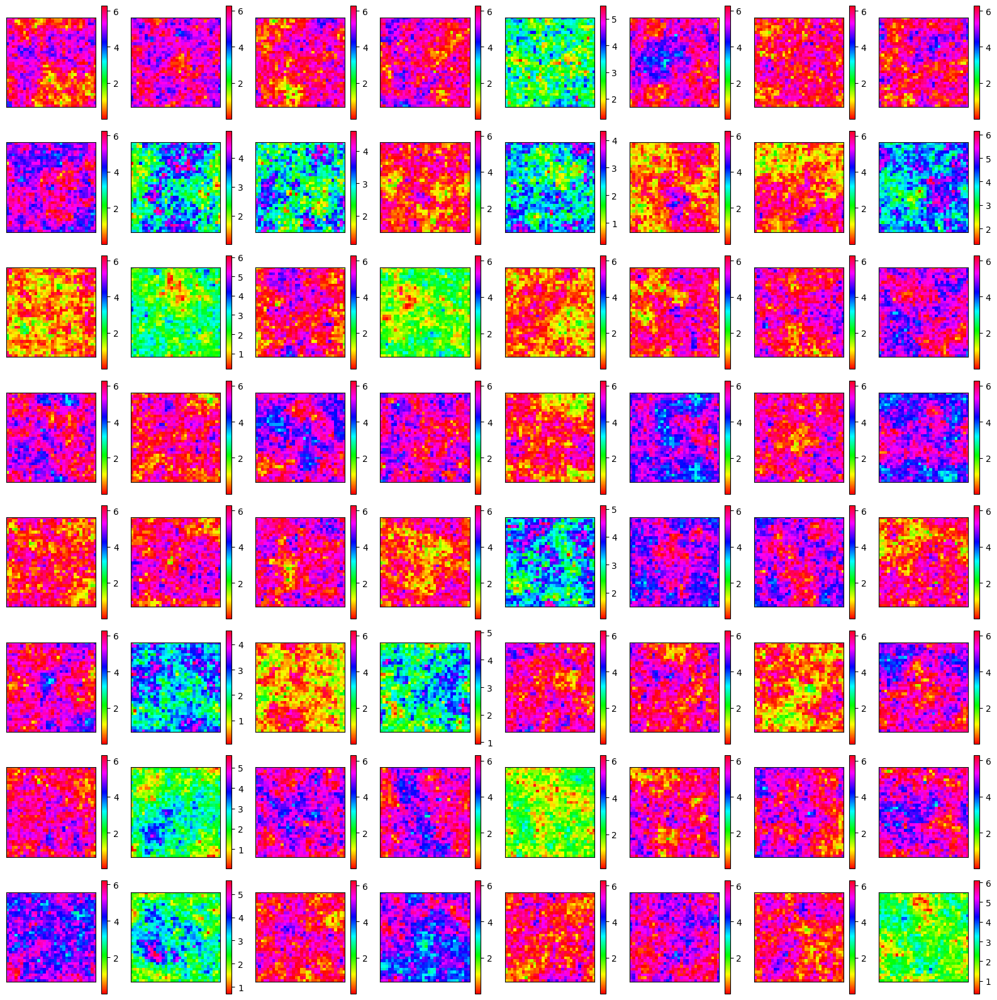

In [268]:
# See sample images

fig = plt.figure(figsize=(16, 16)) 
for i in range(64):  # 8 × 8 grid
    ax = fig.add_subplot(8, 8, i + 1)
    img = ax.imshow(X_batch[i].cpu().view(L, L), cmap='hsv')
    # ax.axis('off')
    ax.set_xticks([])
    ax.set_yticks([])
    
    plt.colorbar(img)

plt.tight_layout()
plt.show()

Text(0.5, 1.0, 'Test Angle Distribution')

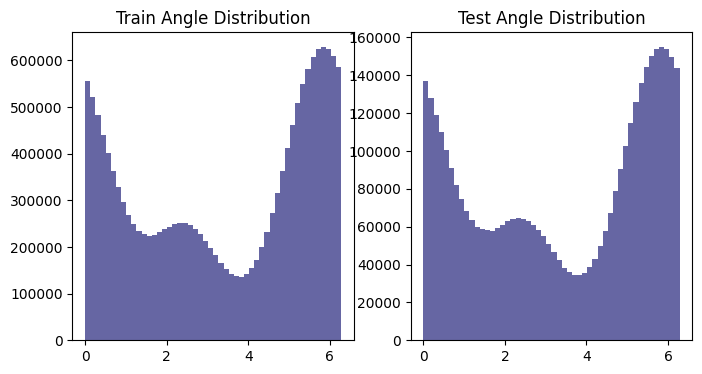

In [269]:
# See angle distributions in train and test sets

fig, ax = plt.subplots(1, 2, figsize = (8, 4))

ax[0].hist(train_loader.dataset.flatten(), bins=50, color=(0, 0, 0.4, 0.6))
ax[0].set_title("Train Angle Distribution")
ax[1].hist(test_loader.dataset.flatten(), bins=50, color=(0, 0, 0.4, 0.6))
ax[1].set_title("Test Angle Distribution")

# 2. Define RBM with VonMises visible units

The total energy is defined as 

$E_\theta(x, h)=-h^TAcos(x)-h^TBsin(x)$

Defining

$\xi(x)= Acos(x) + Bsin(x)$,

total energy can be written as

$E_\theta(x, h)=-h^T\xi(x)$



The visible energy can be defined as

$e^{-\mathcal{E}_\theta(x)}=\sum_{h}^{}e^{-E_\theta(x, h)}$

$\mathcal{E}_\theta(x)= -ln\sum_{h}^{}e^{-E_\theta(x, h)} = -ln\sum_{h}^{}e^{h^T\xi(x)}$

$\sum_{h}^{}e^{h^T\xi(x)} = \prod_{i}^{n_h}(1 + e^{\xi(x)})$

$\mathcal{E}_\theta(x) = -ln\prod_{i}^{n_h}(1 + e^{\xi(x)})$

$\mathcal{E}_\theta(x) = -\sum_{i}^{n_h}ln(1 + e^{\xi(x)})$




In [270]:
class RBM_VonMises(nn.Module):
    """
    RBM with Von Mises visible units and binary hidden units
    variance parameter sigma_j is set to 1
    parameters: A, B
    learning with Markov Chain Monte Carlo methods
    CD-k or PCD-k 
    update parameters for one batch
    calculate data visible energy and model visible energy
    difference between data and model visible energies
    one-step reconstruction mse
    """
    def __init__(self, n_visible, n_hidden):
        super(RBM_VonMises, self).__init__()
        self.n_visible = n_visible # nv
        self.n_hidden = n_hidden # nh

        # Model parameters
        limit = 4.0 * math.sqrt(6.0 / (n_hidden + n_visible))
        
        self.A = nn.Parameter(torch.empty(n_hidden, n_visible).uniform_(-limit, limit)) # (nh, nv)
        self.B = nn.Parameter(torch.empty(n_hidden, n_visible).uniform_(-limit, limit)) # (nh, nv)
        self.h_bias = nn.Parameter(torch.zeros(n_hidden))   # (nh, )

        # Initialize persistent chain
        self.persistent_v = None

    def xi(self, x):
        """
        xi(x)= Acos(x) + Bsin(x)
        input_shape: [batch_size, nv]
        output_shape: [batch_size, nh]
        """
        cosx = torch.cos(x) # size [batch_size, nv]
        sinx = torch.sin(x) # size [batch_size, nv]
        
        return cosx @ self.A.T + sinx @ self.B.T + self.h_bias # size [batch_size, nh]

    def hW(self, h, W):
        """
        return alpha(h) or beta(h)
        alpha(h) = hA
        beta(h) = hB
        input_shape: [batch_size, nh]
        output_shape: [batch_size, nv]
        """
        # size of h is [batch_size, nh]
        # size of W is [nh, nv]
        hxW = h @ W
        return hxW
        
    def bernoulli_sampling(self, p):
        """Sampling from a Bernoulli distribution with prob p."""
        return torch.bernoulli(p)

    def v_to_h(self, v):
        """
        Compute p(h|v) = sigmoid(Acos(x) + Bsin(x))
        and sample v -> h
        input_shape: [batch_size, nv]
        output shape: [batch_size, nh]
        """
        p_h = torch.sigmoid(self.xi(v))
        return self.bernoulli_sampling(p_h)

    def h_to_v(self, h):
        """
        sample h -> v with VonMises Distribution
        input_shape: [batch_size, nh]
        output shape: [batch_size, nv]
        """
        alpha = self.hW(h, self.A) # [batch_size, nv]
        beta = self.hW(h, self.B) # [batch_size, nv]
        
        kappa = torch.sqrt(alpha**2 + beta**2).clamp(min=1e-6, max=1e2) # [batch_size, nv]
        mu = torch.atan2(beta, alpha)
        
        v = D.VonMises(mu, kappa).sample()
        return torch.remainder(v, 2 * torch.pi)

    def langevin_update(self, v, epsilon=0.1):
        """
        None
        """
        raise NotImplementedError("Langevin dynamics for Von Mises visibles not implemented.")
        
    def forward(self, v, mc='gibbs', k=1, epsilon=0.1):
        """
        Performs k-step Gibbs sampling v->h->v' or
        k-step Langevin dynamics sampling v->v'
        """
        v = v.view(-1, self.n_visible) # [batch_size, nv]
      
        if mc == 'gibbs':
            with torch.no_grad(): # Gibbs does not need to do auto_diff
                for _ in range(k):
                    h = self.v_to_h(v)
                    v = self.h_to_v(h)
                    
        elif mc == 'langevin': # Langevin MUST keep autograd to use it
            raise NotImplementedError
                    
        return v #.detach()   

    def visible_energy(self, v):
        """
        Compute the visible energy E(v).
        -sum_{i}^{n_h}ln(1 + e^{xi(x)}
        F.softplus(x) = ln(1 + e^x)
        -sum_{i}^{n_h} torch.softplus(xi(x))
        """
        wxv = self.xi(v) # [batch_size, nh]
        return -torch.sum(F.softplus(wxv), dim=1) # [batch_size,]

    def contrastive_divergence(self, v0, pcd=False, mc='gibbs', k=1, epsilon=0.1, lr=1e-3, weight_decay=1e-4):
        """
        Perform gradient descent for one batch
        with k-step Contrastive Divergence 
        """
        batch_size = v0.size(0)
        v_batch = v0.view(-1, self.n_visible) # [batch_size, nv]

        # -------- Data term / positive phase --------
        with torch.no_grad():
            p_h_batch = torch.sigmoid(self.xi(v_batch)) # [batch_size, nh]
            
        self.A.grad = p_h_batch.T @ torch.cos(v_batch) / batch_size # [nh, nv]
        self.B.grad = p_h_batch.T @ torch.sin(v_batch) / batch_size # [nh, nv]
        self.h_bias.grad = torch.mean(p_h_batch, dim = 0) # [nh, ]
        
        # -------- Gibbs sampling / negative phase --------
        
        # Initialize persistent chain the first time
        if self.persistent_v is None:
            self.persistent_v = v_batch.detach().clone()
            
        if pcd == True: # PCD
            self.persistent_v = self.persistent_v.detach()
            v_sample = self.forward(self.persistent_v, mc, k, epsilon)  # [batch_size, nv]
            self.persistent_v = v_sample.detach().clone()           
        else: # CD
            v_sample = self.forward(v_batch, mc, k, epsilon)  # [batch_size, nv]

        with torch.no_grad():
            p_h_sample = torch.sigmoid(self.xi(v_sample)) # [batch_size, nh]

        # data term - model term
        self.A.grad -= p_h_sample.T @ torch.cos(v_sample) / batch_size # [nh, nv]
        self.B.grad -= p_h_sample.T @ torch.sin(v_sample) / batch_size # [nh, nv]
        self.h_bias.grad -= p_h_sample.mean(dim = 0) # [nh, ]

        # Weight Decay
        self.A.grad -= weight_decay * self.A
        self.B.grad -= weight_decay * self.B
        
        # -------- Manual Parameter updates --------
        with torch.no_grad():
            for param in [self.A, self.B, self.h_bias]:
                param.data += lr * param.grad

        # -------- Diagnostics --------
        E_data = torch.mean(self.visible_energy(v_batch))
        E_model = torch.mean(self.visible_energy(v_sample))       
        E_diff = E_model - E_data
        with torch.no_grad():
            v_recon = self.forward(v_batch, mc='gibbs', k=1)
        MSE = torch.mean(
            (torch.cos(v_recon) - torch.cos(v_batch))**2 + 
            (torch.sin(v_recon) - torch.sin(v_batch))**2
        ) # Cos-Sin MSE
        
        return E_data, E_model, E_diff, MSE

Text(0.5, 1.0, 'Von Mises Distribution')

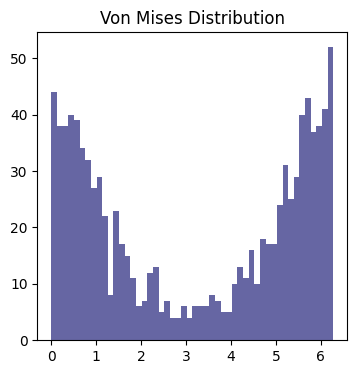

In [271]:
# Generate samples from a Von Mises distribution with mu=0 and kappa=1

mu = 0
kappa = 1

angles = []
for i in range(1000):
    x1_sample = D.VonMises(mu, kappa).sample()
    x1_0to2pi = (x1_sample + 2 * torch.pi) % (2 * torch.pi)
    angles.append(x1_0to2pi)

fig, ax = plt.subplots(1, 1, figsize = (4, 4))

ax.hist(angles, bins=50, color=(0, 0, 0.4, 0.6))
ax.set_title("Von Mises Distribution")

In [274]:
# Define RBM model

p = 32
n_visible = p*p  # 1, 2, or 32x32
n_hidden = 1024  # hidden units

rbm = RBM_VonMises(n_visible, n_hidden).to(device)

# 3. Define and run the training loops

In [275]:
def train(model, train_loader, pcd, mc, k, epsilon, lr, n_epochs, weight_decay):
    """
    Train the RBM model using Contrastive Divergence or Persistent Contrastive Divergence.

    Parameters:
    - model: RBM model instance
    - train_loader: DataLoader for training data
    - pcd: Boolean, True for PCD, False for CD
    - mc: MCMC method, 'gibbs' or 'langevin'
    - k: Number of MCMC steps
    - epsilon: Step size for Langevin dynamics
    - lr: Learning rate
    - n_epochs: Number of training epochs

    Returns:
    - history: Dictionary with training metrics
    """
    if pcd:
        print(f"Training with PCD and {k}-step {mc} updates")
    else:
        print(f"Training with CD and {k}-step {mc} updates")
    
    history = {"E_data": [], "E_model": [], "E_diff": [], "mse": []}

    for epoch in range(n_epochs):
        E_data_epoch, E_model_epoch, E_diff_epoch, mse_epoch = 0., 0., 0., 0.
        for _, batch_data in enumerate(train_loader):
            X_train = batch_data[0] if isinstance(batch_data, list) else batch_data
            X_train = X_train.to(device)
            E_data, E_model, E_diff, mse = model.contrastive_divergence(X_train, pcd, mc, k, epsilon, lr, weight_decay)
            E_data_epoch += E_data.item()
            E_model_epoch += E_model.item()
            E_diff_epoch += E_diff.item()
            mse_epoch += mse.item()
        
        E_data_epoch /= len(train_loader)
        E_model_epoch /= len(train_loader)
        E_diff_epoch /= len(train_loader)
        mse_epoch /= len(train_loader)
        
        history["E_data"].append(E_data_epoch)
        history["E_model"].append(E_model_epoch)

        history["E_diff"].append(E_diff_epoch)
        history["mse"].append(mse_epoch)
            
        print(f"Epoch {epoch + 1}/{n_epochs}, E_data: {E_data_epoch:.4f}, E_model: {E_model_epoch:.4f}, E_diff: {E_diff_epoch:.4f}, mse: {mse_epoch:.4f}")

    return history

In [276]:
# Define training hyperparameters

n_epochs = 500
lr = 0.01
k = 10
pcd = True
mc = 'gibbs'  # gibbs or langevin
epsilon=0.01  # langevin step size

cdtype = 'pcd' if pcd else 'cd'

weight_decay = 1e-4

In [277]:
# Run training

history = train(rbm, train_loader, pcd, mc, k, epsilon, lr, n_epochs, weight_decay)

# unlabeled_loader only for STL10
# history = train(rbm, unlabeled_loader, pcd, mc, k, epsilon, lr, n_epochs, weight_decay)

Training with PCD and 10-step gibbs updates
Epoch 1/500, E_data: -3701.4604, E_model: -3348.7496, E_diff: 352.7108, mse: 0.6260
Epoch 2/500, E_data: -3930.8721, E_model: -3624.1363, E_diff: 306.7358, mse: 0.5651
Epoch 3/500, E_data: -4018.0173, E_model: -3832.9476, E_diff: 185.0696, mse: 0.5219
Epoch 4/500, E_data: -4094.8327, E_model: -3928.1409, E_diff: 166.6917, mse: 0.5034
Epoch 5/500, E_data: -4176.2369, E_model: -4015.2979, E_diff: 160.9389, mse: 0.4875
Epoch 6/500, E_data: -4255.3481, E_model: -4095.1646, E_diff: 160.1835, mse: 0.4768
Epoch 7/500, E_data: -4326.1412, E_model: -4153.2512, E_diff: 172.8900, mse: 0.4680
Epoch 8/500, E_data: -4369.5609, E_model: -4218.0413, E_diff: 151.5195, mse: 0.4585
Epoch 9/500, E_data: -4406.1072, E_model: -4242.4279, E_diff: 163.6793, mse: 0.4532
Epoch 10/500, E_data: -4445.4259, E_model: -4297.1575, E_diff: 148.2684, mse: 0.4457
Epoch 11/500, E_data: -4500.1675, E_model: -4357.7379, E_diff: 142.4296, mse: 0.4394
Epoch 12/500, E_data: -4542.92

In [ ]:
# Resume Training
n_epochs = 1

history_temp = train(rbm, train_loader, pcd, mc, k, epsilon, lr, n_epochs)

for key in history:
    history[key].extend(history_temp[key])

n_epochs = len(history["E_data"])
print("Total epochs: ", n_epochs)

In [ ]:
'''
Specfiy output directory and the directory name.
Resulting file structure will be:
├── out_dir
    ├── checkpoints
    |   └── dir_name
    ├── figures
    |   └── dir_name
    └── history
        └── dir_name
'''

out_dir = path.join("..", "outputs")
run_name = "Binary1"

checkpoints_dir = path.join(out_dir, "checkpoints", run_name)
figures_dir = path.join(out_dir, "figures", run_name)
history_dir = path.join(out_dir, "history", run_name)

os.makedirs(checkpoints_dir, exist_ok=True)
os.makedirs(figures_dir, exist_ok=True)
os.makedirs(history_dir, exist_ok=True)

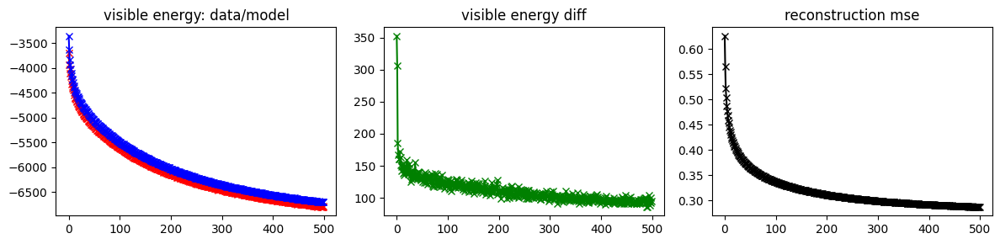

In [ ]:
# Plot history

fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(12, 3))

axes[0].plot(history["E_data"],'rx-')
axes[0].plot(history["E_model"],'bx-')

axes[1].plot(history["E_diff"],'gx-')
axes[2].plot(history["mse"],'kx-')

axes[0].set_title('visible energy: data/model')
axes[1].set_title('visible energy diff')
axes[2].set_title('reconstruction mse')

plt.tight_layout()
plt.show()

fig.savefig(path.join(figures_dir, 'training_history.png'), dpi=600, bbox_inches='tight')

# 4. Optional saving and reloading steps

## (4.1) Save model parameters and training results

In [ ]:
# Save parameters as numpy array files

for name, param in rbm.state_dict().items():
    print(f'parameter: {name}, size: {param.size()}')
    np.save(os.path.join(checkpoints_dir, f"{name}.npy"), param.cpu().numpy())

np.save(os.path.join(history_dir, f"training_nh{n_hidden}{cdtype}-{k}{mc}_lr{lr}.npy"), history, allow_pickle=True)  # save a list of dictionary

parameter: A, size: torch.Size([1024, 1024])
parameter: B, size: torch.Size([1024, 1024])
parameter: h_bias, size: torch.Size([1024])


## (4.2) Reload parameters or training results

In [ ]:
################################################
# To load parameters from npy file
################################################

state_dict = rbm.state_dict()  # get a copy of current state dict
for name in state_dict.keys():
    param = np.load(os.path.join(checkpoints_dir, f"{name}.npy"))
    state_dict[name] = torch.tensor(param)

rbm.load_state_dict(state_dict)  # this actually loads the parameters

training_history = np.load(os.path.join(history_dir, f"training_nh{n_hidden}{cdtype}-{k}{mc}_lr{lr}.npy"), allow_pickle=True).tolist()  # a list of dictionary

# 5. Reconstruction test

In [282]:
def wrap(array, minim=-np.pi, maxim=np.pi):
    """
    Wrap angles in array to the range [minim, maxim).
    Input:
    - array: Tensor of angles to wrap
    - minim: Minimum angle (default -π)
    - maxim: Maximum angle (default π)

    Returns:
    - Wrapped angles in the range [minim, maxim)
    """
    width = maxim - minim  # = 2π
    return (array - minim) % width + minim

In [283]:
# Reconstruction using a small batch

# Get batch
test_batch = next(iter(test_loader))
X_test = test_batch[0] if isinstance(test_batch, list) else test_batch

# Reconstruction from first 10 in batch
X_test = X_test[:10].to(device)

In [284]:
# Reconstruction Using the entire test dataset

X_test = test_loader.dataset
X_test = X_test.to(device)

In [285]:
# Use Gibbs sampling for generation

with torch.no_grad():  # no graph, avoid GPU memory growth
    X_recon = rbm.forward(X_test, mc='gibbs', k=1).detach() 
# X_recon = X_recon.clamp(0,1)

In [286]:
# Ensure angles are wrapped to -pi to +pi

X_test_wrapped = wrap(X_test, -np.pi, np.pi)
X_recon_wrapped = wrap(X_test, -np.pi, np.pi)

In [287]:
# See test and reconstructed shapes

print(X_test_wrapped.shape)
print(X_recon_wrapped.shape)

torch.Size([4000, 1024])
torch.Size([4000, 1024])


## 5.1 Dihedral Angles

Reconstruction with a visible unit count of 2.

Text(0.5, 1.0, 'Reconstructed')

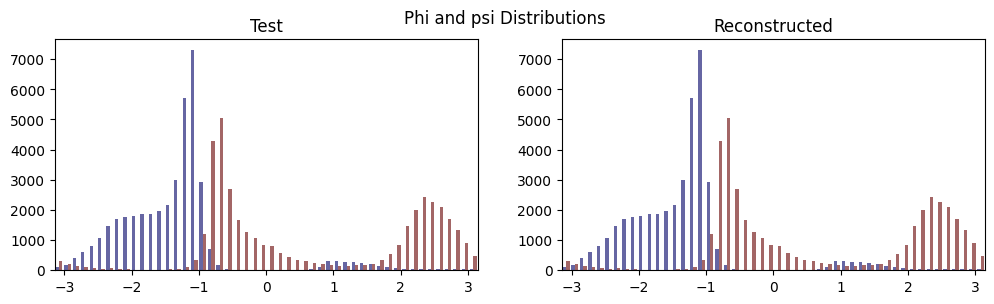

In [178]:
# See histogram distributions of phi and psi angles.

fig, axes = plt.subplots(1, 2, figsize=(12, 3))

fig.suptitle("Phi and psi Distributions")

ax_test = axes[0]
ax_recon = axes[1]

ax_test.hist(X_test_wrapped.cpu(), bins=50, color=((0, 0, 0.4, 0.6), (0.4, 0, 0, 0.6)))
ax_test.set_xlim(-np.pi, np.pi)
ax_test.set_title("Test")

ax_recon.hist(X_recon_wrapped.cpu(), bins=50, color=((0, 0, 0.4, 0.6), (0.4, 0, 0, 0.6)))
ax_recon.set_xlim(-np.pi, np.pi)
ax_recon.set_title("Reconstructed")

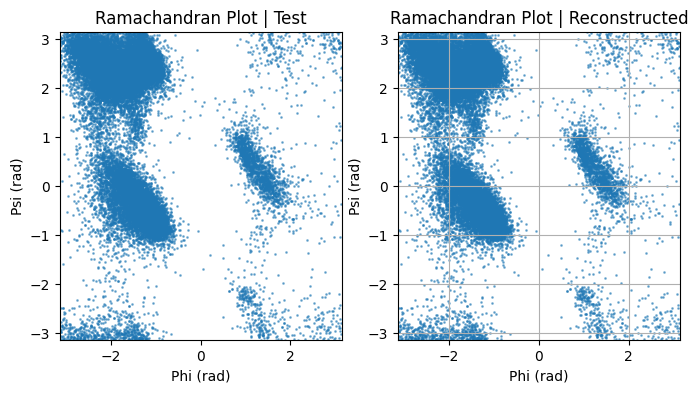

In [179]:
# See Ramchadran plot

test_phi = X_test_wrapped.cpu()[:, 0]
test_psi = X_test_wrapped.cpu()[:, 1]

recon_phi = X_recon_wrapped.cpu()[:, 0]
recon_psi = X_recon_wrapped.cpu()[:, 1]

fig, axes = plt.subplots(1, 2, figsize = (8, 4))

ax_test = axes[0]
ax_recon = axes[1]

ax_test.scatter(test_phi, test_psi, alpha=0.5, s=1)
ax_test.set_xlim(-np.pi, np.pi)
ax_test.set_ylim(-np.pi, np.pi)
ax_test.set_xlabel("Phi (rad)")
ax_test.set_ylabel("Psi (rad)")
ax_test.set_title("Ramachandran Plot | Test")

ax_recon.scatter(recon_phi, recon_psi, alpha=0.5, s=1)
ax_recon.set_xlim(-np.pi, np.pi)
ax_recon.set_ylim(-np.pi, np.pi)
ax_recon.set_xlabel("Phi (rad)")
ax_recon.set_ylabel("Psi (rad)")
ax_recon.set_title("Ramachandran Plot | Reconstructed")

plt.grid(True)
plt.show()

## 5.2 NDBC Dataset

Reconstruction with a visible unit count of 1.

Text(0.5, 1.0, 'Reconstructed')

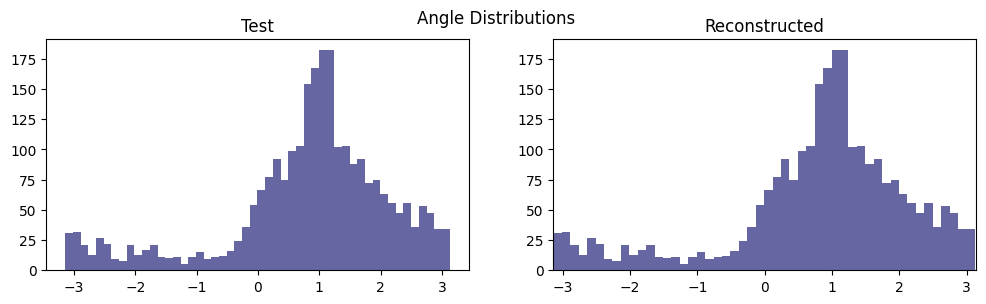

In [258]:
fig, axes = plt.subplots(1, 2, figsize=(12, 3))

fig.suptitle("Angle Distributions")

ax_test = axes[0]
ax_recon = axes[1]

ax_test.hist(X_test_wrapped.cpu(), bins=50, color=((0, 0, 0.4, 0.6)))
ax_test.set_title("Test")

ax_recon.hist(X_recon_wrapped.cpu(), bins=50, color=((0, 0, 0.4, 0.6)))
ax_recon.set_xlim(-np.pi, np.pi)
ax_recon.set_title("Reconstructed")

## 5.3 XY Model

Reconstruction with an XY Model with pxp visible units.

In [310]:
import math
import warnings

def XY_energy(tensor, dimension=[p, p], J = 1.0):
    '''
    Given a batch of configurations, compute the XY energy for each configuration.

    Parameters:
    - tensor: A batch of configurations, shape [batch_size, p * p] or
    [p * p] for a single configuration.
    - dimension: The dimensions of the grid.
    - J: The coupling constant.

    Returns:
    - E: A tensor of energies for each configuration, shape [batch_size, ]

    Input size: [batch_size, p * p]
    Output size: [batch_size, ]
    '''
    if tensor.dim() == 2:
        batch_size = tensor.shape[0]
        size = tensor.shape[1]
        
    elif tensor.dim() == 1:
        batch_size = 1
        size = tensor.shape[0]
    else:
        warnings.warn(f"Usage: ising_energy(Tensor[batch_size, p * p], dimension=[p * p], J = 1.0).")
        
    # If dimension is not provided, assume it's a square grid and infer dimensions from size
    if dimension == None:
        if not math.isqrt(size):
            warnings.warn(f"Tensor's 2nd dimension needs to be a perfect square if dim is set to None. Tensor shape is: {tensor.shape}")
        sqrt = np.sqrt(size)
        dimension = [int(sqrt), int(sqrt)]

    dim1, dim2 = dimension
    grid = tensor.view(batch_size, dim1, dim2)
    right = grid.roll(shifts=-1, dims=2) # Horizontal Neighbors
    down = grid.roll(shifts=-1, dims=1) # Vertical Neighbors

    E_h = torch.cos(grid - right)
    E_v = torch.cos(grid - down)

    sums = E_h.sum(dim=(1,2)) + E_v.sum(dim=(1,2))
    E = -J * sums

    return E

def XY_capacity(energies, T, k_B = 1.0):
    '''
    Given a batch of energies given by the previous function, 
    compute the heat capacity.

    Parameters:
    - energies: A batch of energies, shape [batch_size, ]
    - T: The temperature.
    - k_B: The Boltzmann constant.

    Returns:
    - C: The heat capacity, shape [1, ]

    Input size: [batch_size, ] of Energies
    Output size: [1, ]
    '''

    E_mean = energies.mean()
    E2_mean = (energies**2).mean()

    C = (E2_mean - E_mean**2) / (k_B * T**2)
    
    return C

def XY_magnetization_chi(tensor, T, k_B = 1.0):
    '''
    Given a batch of configurations, compute the 
    magnetization and susceptibility.

    Parameters:
    - tensor: A batch of configurations, shape [batch_size, p * p] or
    [p * p] for a single configuration.
    - T: The temperature.
    - k_B: The Boltzmann constant.

    Returns:
    - m_mean: The mean magnetization, shape [1, ]
    - chi: The susceptibility, shape [1, ]
    as a m_mean, chi tuple

    Input size: [batch_size, p * p]
    Output size: [2, ]
    '''
    N = tensor.shape[1]

    cos = torch.cos(tensor)
    sin = torch.sin(tensor)

    mx = cos.sum(dim=1)
    my = sin.sum(dim=1)

    m2 = (mx**2 + my**2) / N**2
    m = torch.sqrt(m2)

    m2_mean = m2.mean()
    m_mean = m.mean()

    chi = N * (m2_mean - m_mean**2) / (k_B * T)

    return m_mean * N, chi * N

In [311]:
# Test XY energy function with a simple example

example_config = torch.zeros(1, 4)

E = XY_energy(example_config, [2, 2])
C = XY_capacity(E, float(T))
m, chi = XY_magnetization_chi(example_config, float(T))

N = example_config.shape[1]

print("Total Energy (E): ", E)
print("Energy per site (E/N): ", E / N)
print("Total Heat Capacity (C): ", C)
print("Heat Capacity per site (C/N): ", C / N)
print("Total Magnetization (m): ", m)
print("Magnetization per site (m/N): ", m / N)
print("Total Susceptibility (chi): ", chi)
print("Susceptibility per site (chi/N): ", chi / N)

Total Energy (E):  tensor([-8.])
Energy per site (E/N):  tensor([-2.])
Total Heat Capacity (C):  tensor(0.)
Heat Capacity per site (C/N):  tensor(0.)
Total Magnetization (m):  tensor(4.)
Magnetization per site (m/N):  tensor(1.)
Total Susceptibility (chi):  tensor(0.)
Susceptibility per site (chi/N):  tensor(0.)


In [312]:
# Compute Energies

X_test_energy = XY_energy(X_test.cpu())
X_recon_energy = XY_energy(X_recon.cpu())

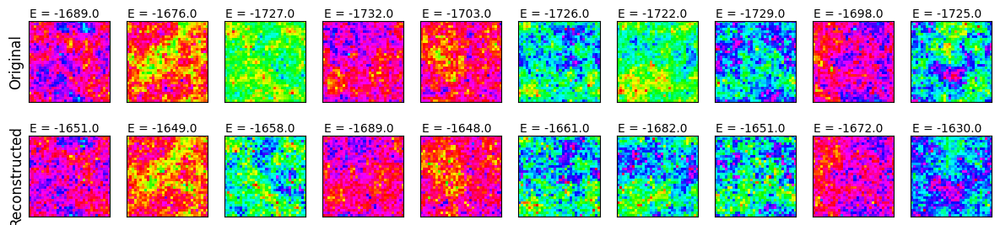

In [313]:
# See First 10 Reconstructed vs Original images along with their computed energies


fig, axes = plt.subplots(2, 10, figsize=(12, 3))
for i in range(10):
    axes[0, i].imshow(X_test[i].cpu().view(p, p), cmap='hsv') # use "binary" for v=0,1 "gray" for 0<v<1
    #axes[0, i].axis("off")
    axes[0, i].set_xticks([])
    axes[0, i].set_yticks([])
    axes[0, i].text(0, -2, f"E = {X_test_energy[i].round()}")
    axes[1, i].imshow(X_recon[i].cpu().view(p, p), cmap='hsv')
    #axes[1, i].axis("off")
    axes[1, i].set_xticks([])
    axes[1, i].set_yticks([])
    axes[1, i].text(0, -2, f"E = {X_recon_energy[i].round()}")
axes[0, 0].set_ylabel("Original", fontsize=12)
axes[1, 0].set_ylabel("Reconstructed", fontsize=12)
plt.tight_layout()
plt.show()

Text(0.5, 1.0, 'Recon Angle Distribution')

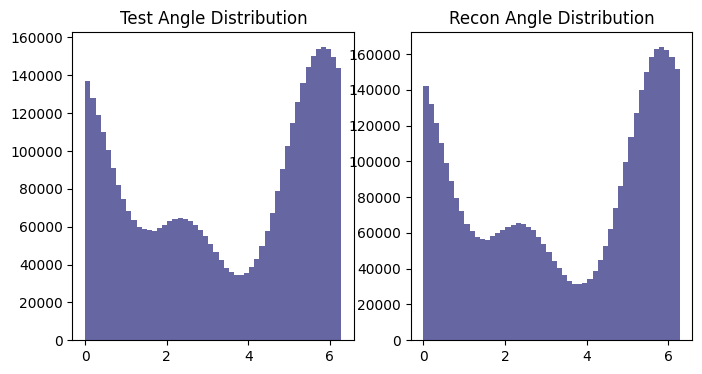

In [314]:
# Plot Reconstructed vs Original angle distributions

fig, ax = plt.subplots(1, 2, figsize = (8, 4))

ax[0].hist(X_test.cpu().flatten(), bins=50, color=(0, 0, 0.4, 0.6))
ax[0].set_title("Test Angle Distribution")
ax[1].hist(X_recon.cpu().flatten(), bins=50, color=(0, 0, 0.4, 0.6))
ax[1].set_title("Recon Angle Distribution")

In [315]:
X_test_energy = XY_energy(X_test.cpu())
X_recon_energy = XY_energy(X_recon.cpu())

X_test_capacity = XY_capacity(X_test_energy, float(T))
X_recon_capacity = XY_capacity(X_recon_energy, float(T))

X_test_magnetization, X_test_chi = XY_magnetization_chi(X_test.cpu(), float(T))
X_recon_magnetization, X_recon_chi = XY_magnetization_chi(X_recon.cpu(), float(T))

N = X_test.shape[1]

print(X_test_energy)
print(X_recon_energy)

print(X_test_energy.shape)
print(X_recon_energy.shape)

print("Test E/N", X_test_energy.mean() / N)
print("Recon E/N", X_recon_energy.mean() / N)
print("Test C/N", X_test_capacity / N)
print("Recon C/N", X_recon_capacity / N)
print("Test M/N", X_test_magnetization / N)
print("Recon M/N", X_recon_magnetization / N)
print("Test Chi/N", X_test_chi / N)
print("Recon Chi/N", X_recon_chi / N)

tensor([-1688.6870, -1675.8367, -1726.6760,  ..., -1715.5786, -1723.6699,
        -1698.8751])
tensor([-1651.1650, -1648.9392, -1657.6685,  ..., -1668.7524, -1677.9109,
        -1684.2573])
torch.Size([4000])
torch.Size([4000])
Test E/N tensor(-1.6681)
Recon E/N tensor(-1.6233)
Test C/N tensor(0.6368)
Recon C/N tensor(1.0505)
Test M/N tensor(0.8034)
Recon M/N tensor(0.8114)
Test Chi/N tensor(1.1911)
Recon Chi/N tensor(0.6926)


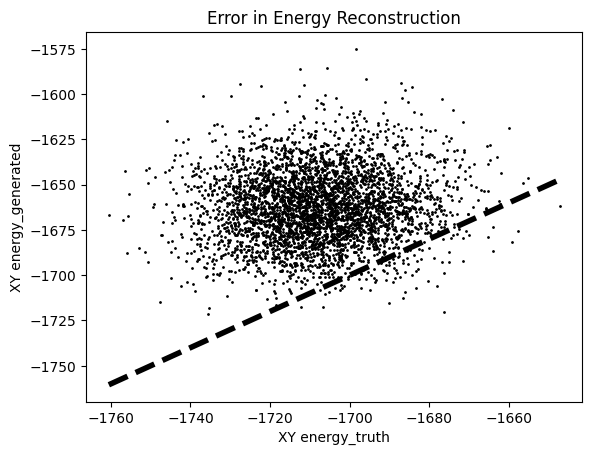

In [316]:
# Compare test and recon energies with a scatter plot.
# Ideally, they should lie on the y=x line if reconstruction is perfect.

plt.scatter(X_test_energy, X_recon_energy,color='k',s=1)
XE_min = X_test_energy.min()
XE_max = X_test_energy.max()

plt.plot([XE_min,XE_max],[XE_min,XE_max],'k--', linewidth=4)
plt.title('Error in Energy Reconstruction')
plt.xlabel('XY energy_truth')
plt.ylabel('XY energy_generated')
plt.show()

tensor(3.3722) tensor(0.0343)
tensor(3.3722) tensor(0.0100)
tensor(3.1092) tensor(0.0762)
tensor(3.1092) tensor(0.0121)


Text(0, 0.5, 'Cos_generated')

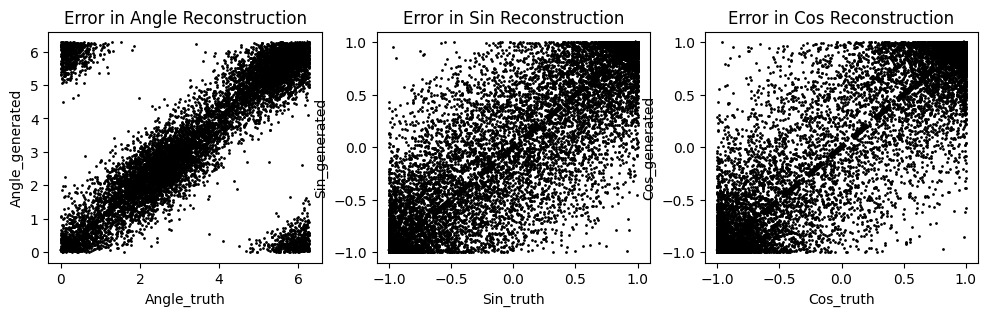

In [317]:
# Plot errors in angle reconstruction and also
# visualize resulting erros in sin and cos 

X_test_angles = X_test[:10].view(-1).cpu()
X_recon_angles = X_recon[:10].view(-1).cpu()

X_test_cos = torch.cos(X_test_angles)
X_test_sin = torch.sin(X_test_angles)
X_recon_cos = torch.cos(X_recon_angles)
X_recon_sin = torch.sin(X_recon_angles)

print(X_test_angles.mean(), X_test_angles.cos().mean())
print(X_test_angles.mean(), X_test_angles.sin().mean())
print(X_test_angles.median(), X_test_cos.median())
print(X_test_angles.median(), X_test_sin.median())

fig, axes = plt.subplots(1, 3, figsize=(12, 3))
ax_angles, ax_sin, ax_cos = axes[:]


ax_angles.scatter(X_test_angles, X_recon_angles, color='k',s=1)
ax_angles.plot([0,np.pi * 2],[0,np.pi * 2],'k--', linewidth=4)
ax_angles.set_title('Error in Angle Reconstruction')
ax_angles.set_xlabel('Angle_truth')
ax_angles.set_ylabel('Angle_generated')

ax_sin.scatter(X_test_sin, X_recon_sin, color='k',s=1)
ax_sin.plot([-1, 1],[-1, 1],'k--', linewidth=4)
ax_sin.set_title('Error in Sin Reconstruction')
ax_sin.set_xlabel('Sin_truth')
ax_sin.set_ylabel('Sin_generated')

ax_cos.scatter(X_test_cos, X_recon_cos, color='k',s=1)
ax_cos.plot([-1,1],[-1,1],'k--', linewidth=4)
ax_cos.set_title('Error in Cos Reconstruction')
ax_cos.set_xlabel('Cos_truth')
ax_cos.set_ylabel('Cos_generated')

(array([ 946.,  435.,  323.,  281.,  232.,  227.,  232.,  202.,  176.,
         145.,  153.,  158.,  133.,  147.,  122.,  101.,  102.,  120.,
         104.,   97.,  105.,  103.,  112.,  100.,   81.,   99.,   97.,
          91.,  116.,   90.,   99.,  114.,  114.,  124.,  122.,  105.,
         109.,  122.,  156.,  164.,  170.,  184.,  182.,  207.,  249.,
         256.,  300.,  361.,  446., 1226.]),
 array([-1.        , -0.95999998, -0.92000002, -0.88      , -0.84000003,
        -0.80000001, -0.75999999, -0.72000003, -0.68000001, -0.63999999,
        -0.60000002, -0.56      , -0.51999998, -0.48000002, -0.44      ,
        -0.40000004, -0.36000001, -0.31999999, -0.28000003, -0.24000001,
        -0.20000005, -0.16000003, -0.12      , -0.08000004, -0.04000002,
         0.        ,  0.03999996,  0.07999992,  0.12      ,  0.15999997,
         0.19999993,  0.24000001,  0.27999997,  0.31999993,  0.36000001,
         0.39999998,  0.43999994,  0.48000002,  0.51999998,  0.55999994,
         0.59999

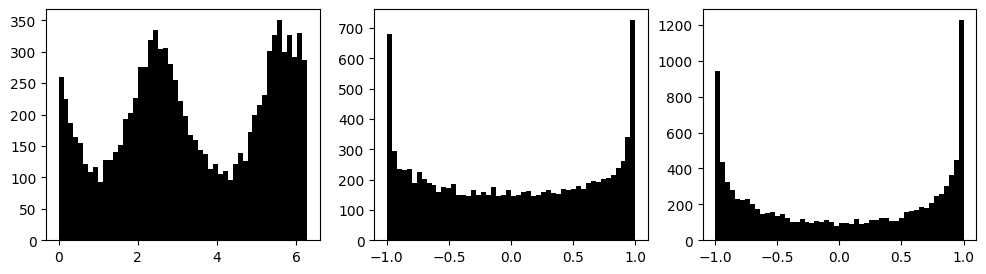

In [318]:
# See histogram distributions of angles, sin, and cos
# from the test dataset.

fig, axes = plt.subplots(1, 3, figsize=(12, 3))
ax_angles, ax_sin, ax_cos = axes[:]

ax_angles.hist(X_test_angles, bins=50, color='k')
ax_sin.hist(X_test_sin, bins=50, color='k')
ax_cos.hist(X_test_cos, bins=50, color='k')

torch.Size([4000])
torch.Size([4000])


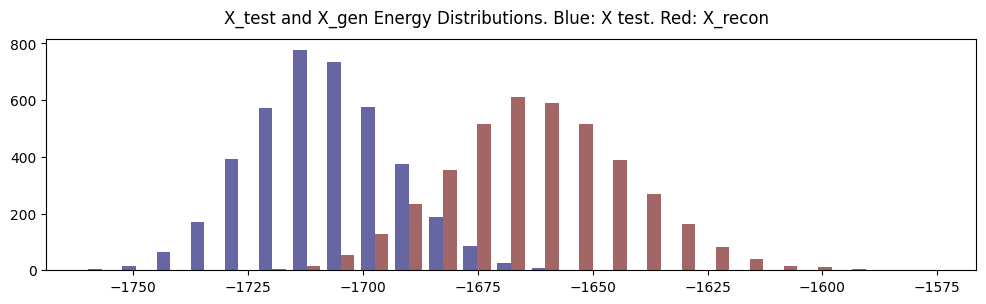

In [ ]:
print(X_recon_energy.shape)
print(X_test_energy.shape)

fig, axes = plt.subplots(1, 1, figsize=(12, 3))

fig.suptitle("X_test and X_gen Energy Distributions. Blue: X test. Red: X_recon")

axes.hist((X_test_energy.cpu(), X_recon_energy.cpu()), bins=25, color=((0, 0, 0.4, 0.6), (0.4, 0, 0, 0.6)))
# ax_recon.set_xlim(-np.pi, np.pi)

fig.savefig(os.path.join(figures_dir, "X_test, X_recon Energies.png"))

# 6.  Generation from random start

It is easier to generate from random binary ${\bf h}_0$ to initialize a valid starting visible units ${\bf h}_0 \to {\bf v}_0$.

In [ ]:
# Generate starting from a random pixel distribution or a random hidden unit distribution.
# Commented out lines are for different initializations.


n_sample = 2048
k_gen = 1000

ph = 0.6 # Bernoulli probability
h0 = torch.bernoulli(torch.ones(n_sample, n_hidden)*ph).float().to(device)  # bernoulli 0,1 with probability ph
X0 = rbm.h_to_v(h0)

# X0 = torch.rand((n_sample, n_visible),requires_grad=False).float().to(device)  # uniform [0,1]
# X0 = torch.randint(1, (n_sample, n_visible),requires_grad=False).float().to(device)  # uniform binary 0,1
# X0 = torch.bernoulli(torch.ones(n_sample, n_visible)*0.3).float().to(device)  # bernoulli 0,1 with probability
# X0 = (0.1 + 0.1*torch.randn((n_sample, n_visible),requires_grad=False)).clamp(0,1).float().to(device)

In [299]:
# Use Gibbs sampling for generation

with torch.no_grad():  # no graph, avoid GPU memory growth
    X_gen = rbm.forward(X0, k=k_gen).detach() 
# X_gen = X_gen.clamp(0,1)

X_gen_wrapped = wrap(X_gen)

## 6.1 Dihedral Angles

Generation with a visible unit count of 2.

Text(0.5, 1.0, 'Generated')

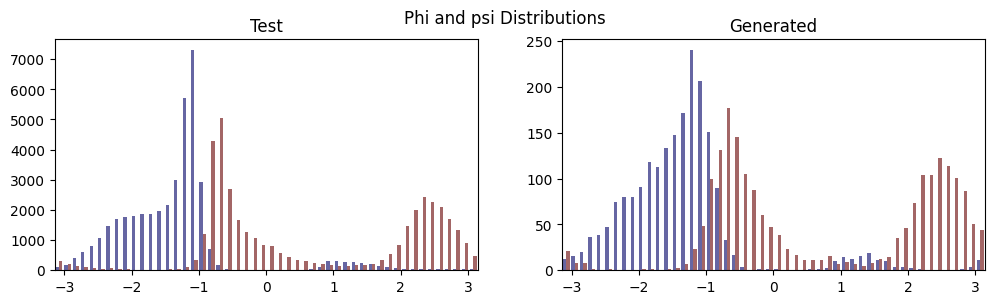

In [ ]:
# Check phi and psi angle distributions

fig, axes = plt.subplots(1, 2, figsize=(12, 3))

fig.suptitle("Phi and psi Distributions")

ax_test = axes[0]
ax_gen = axes[1]

ax_test.hist(X_test_wrapped.cpu(), bins=50, color=((0, 0, 0.4, 0.6), (0.4, 0, 0, 0.6)))
ax_test.set_xlim(-np.pi, np.pi)
ax_test.set_title("Test")

ax_gen.hist(X_gen_wrapped.cpu(), bins=50, color=((0, 0, 0.4, 0.6), (0.4, 0, 0, 0.6)))
ax_gen.set_xlim(-np.pi, np.pi)
ax_gen.set_title("Generated")

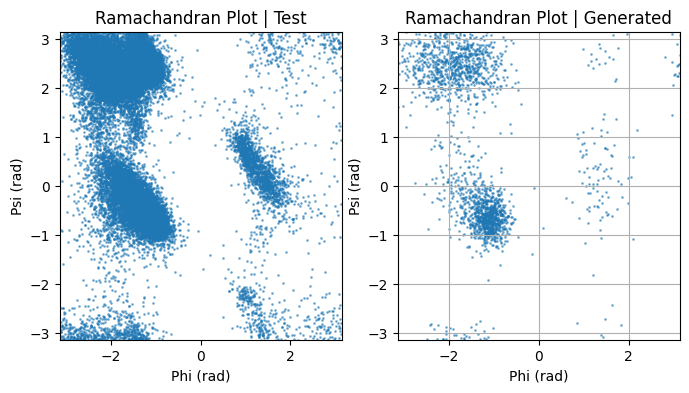

In [183]:
# See Ramchadran plot

test_phi = X_test_wrapped.cpu()[:, 0]
test_psi = X_test_wrapped.cpu()[:, 1]

gen_phi = X_gen_wrapped.cpu()[:, 0]
gen_psi = X_gen_wrapped.cpu()[:, 1]

fig, axes = plt.subplots(1, 2, figsize = (8, 4))

ax_test = axes[0]
ax_recon = axes[1]

ax_test.scatter(test_phi, test_psi, alpha=0.5, s=1)
ax_test.set_xlim(-np.pi, np.pi)
ax_test.set_ylim(-np.pi, np.pi)
ax_test.set_xlabel("Phi (rad)")
ax_test.set_ylabel("Psi (rad)")
ax_test.set_title("Ramachandran Plot | Test")

ax_recon.scatter(gen_phi, gen_psi, alpha=0.5, s=1)
ax_recon.set_xlim(-np.pi, np.pi)
ax_recon.set_ylim(-np.pi, np.pi)
ax_recon.set_xlabel("Phi (rad)")
ax_recon.set_ylabel("Psi (rad)")
ax_recon.set_title("Ramachandran Plot | Generated")

plt.grid(True)
plt.show()

## 6.2 NDBC Dataset

Generation with a visible unit count of 1.

Text(0.5, 1.0, 'Generated')

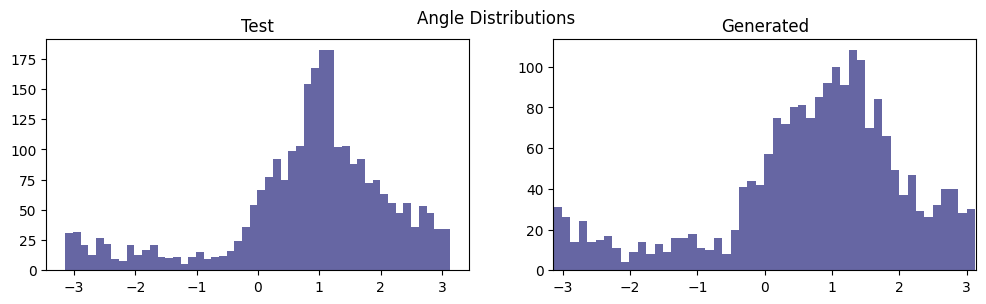

In [ ]:
# Check angle distributions

fig, axes = plt.subplots(1, 2, figsize=(12, 3))

fig.suptitle("Angle Distributions")

ax_test = axes[0]
ax_gen = axes[1]

ax_test.hist(wrap(X_test.cpu(), -np.pi, np.pi), bins=50, color=((0, 0, 0.4, 0.6)))
ax_test.set_title("Test")

ax_gen.hist(X_gen_wrapped.cpu(), bins=50, color=((0, 0, 0.4, 0.6)))
ax_gen.set_xlim(-np.pi, np.pi)
ax_gen.set_title("Generated")

## 6.3 XY Dataset

In [300]:
# Calculate and compare physical quantities of generated samples with test samples

X_test_energy = XY_energy(test_loader.dataset.cpu())
X_gen_energy = XY_energy(X_gen.cpu())

X_test_capacity = XY_capacity(X_test_energy, float(T))
X_gen_capacity = XY_capacity(X_gen_energy, float(T))

X_test_magnetization, X_test_chi = XY_magnetization_chi(X_test.cpu(), float(T))
X_gen_magnetization, X_gen_chi = XY_magnetization_chi(X_gen.cpu(), float(T))

print(X_test_energy)
print(X_gen_energy)

print(X_test_energy.shape)
print(X_gen_energy.shape)

print("Test E/N", X_test_energy.mean() / 1024)
print("gen E/N", X_gen_energy.mean() / 1024)

print("Test C/N", X_test_capacity / 1024)
print("gen C/N", X_gen_capacity / 1024)

print("Test M/N", X_test_magnetization / 1024)
print("gen M/N", X_gen_magnetization / 1024)

print("Test Chi/N", X_test_chi / 1024)
print("gen Chi/N", X_gen_chi / 1024)

tensor([-1688.6870, -1675.8367, -1726.6760,  ..., -1715.5786, -1723.6699,
        -1698.8751])
tensor([-1651.4224, -1696.6008, -1652.1063,  ..., -1697.0007, -1696.4523,
        -1684.4093])
torch.Size([4000])
torch.Size([2048])
Test E/N tensor(-1.6681)
gen E/N tensor(-1.6447)
Test C/N tensor(0.6368)
gen C/N tensor(0.8769)
Test M/N tensor(0.8034)
gen M/N tensor(0.7987)
Test Chi/N tensor(1.1911)
gen Chi/N tensor(1.0392)


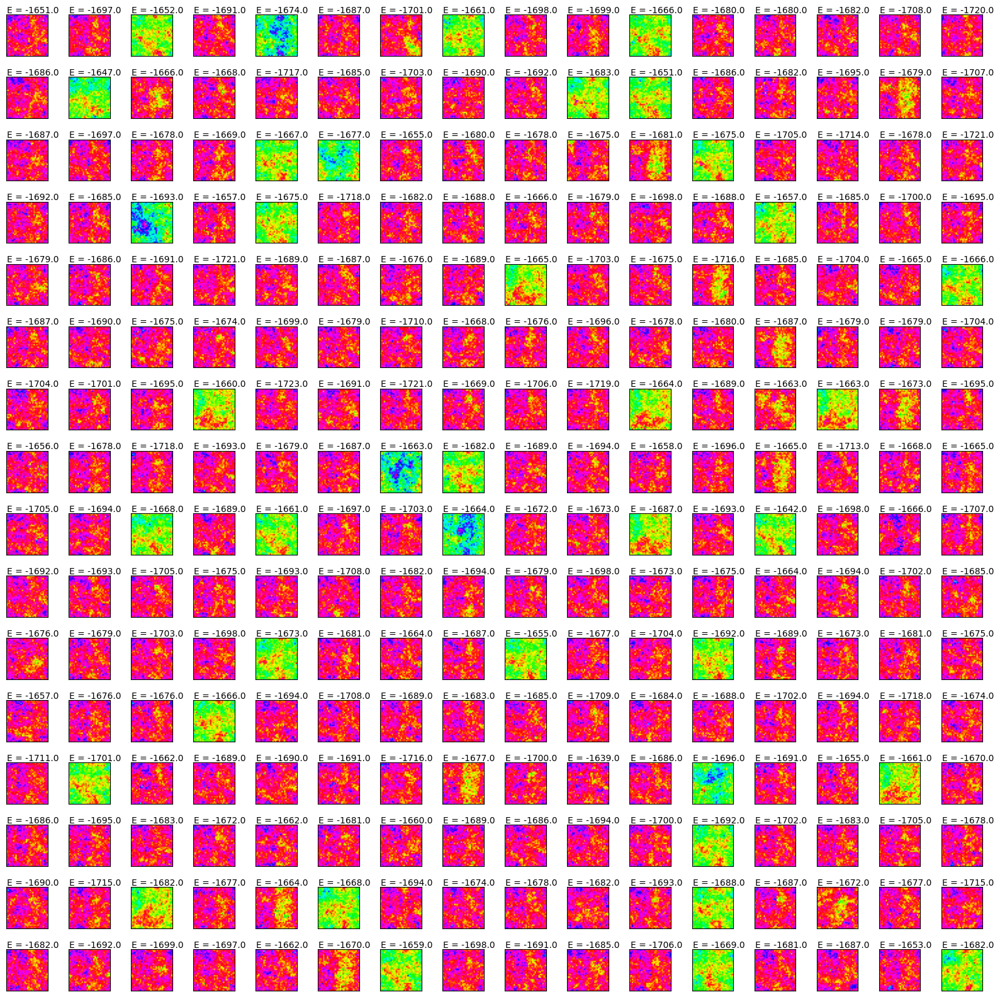

In [303]:
# See generated images

fig = plt.figure(figsize=(16, 16)) 
for i in range(256):   # 16 × 16
    ax = fig.add_subplot(16, 16, i + 1)
    ax.imshow(X_gen[i].cpu().view(p, p), cmap='hsv')
    #ax.axis('off')
    ax.set_xticks([])
    ax.set_yticks([])
    ax.text(0, -2, f"E = {X_gen_energy[i].round()}")

plt.tight_layout()
plt.show()

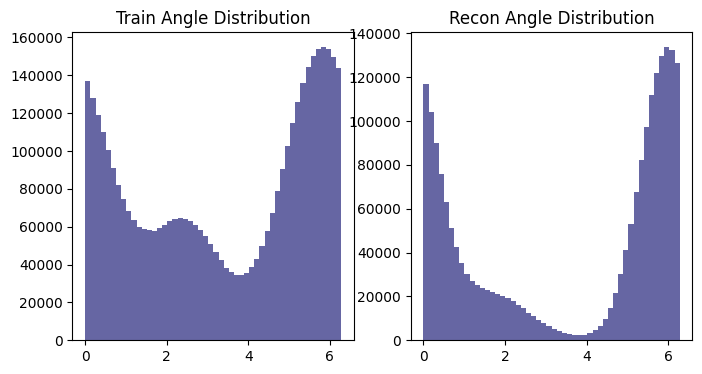

In [ ]:
# See angle distributions in train and recon sets

fig, ax = plt.subplots(1, 2, figsize = (8, 4))

ax[0].hist(X_test.cpu().flatten(), bins=50, color=(0, 0, 0.4, 0.6))
ax[0].set_title("Train Angle Distribution")
ax[1].hist(X_gen.cpu().flatten(), bins=50, color=(0, 0, 0.4, 0.6))
ax[1].set_title("Recon Angle Distribution")

fig.savefig(os.path.join(figures_dir, './ReconAngleDist.png'), dpi = 600, bbox_inches='tight')

torch.Size([2048])
torch.Size([4000])


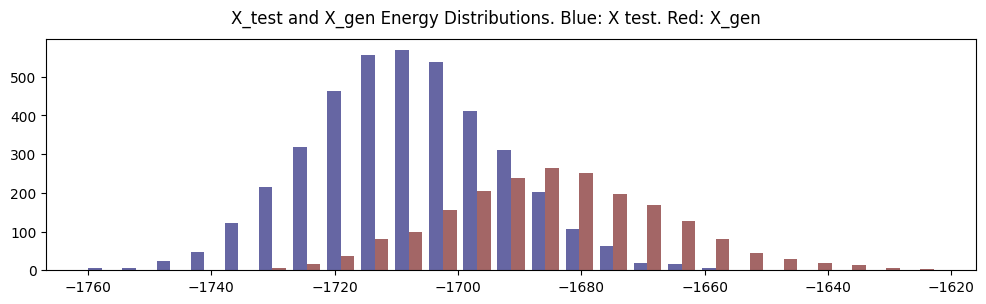

In [ ]:
# See energy distributions in test and gen sets

print(X_gen_energy.shape)
print(X_test_energy.shape)

fig, axes = plt.subplots(1, 1, figsize=(12, 3))

fig.suptitle("X_test and X_gen Energy Distributions. Blue: X test. Red: X_gen")

axes.hist((X_test_energy.cpu(), X_gen_energy.cpu()), bins=25, color=((0, 0, 0.4, 0.6), (0.4, 0, 0, 0.6)))
# ax_recon.set_xlim(-np.pi, np.pi)

fig.savefig(os.path.join(figures_dir, "X_test, X_gen Energies.png"))

# 7.1 Weight Matrices A, B

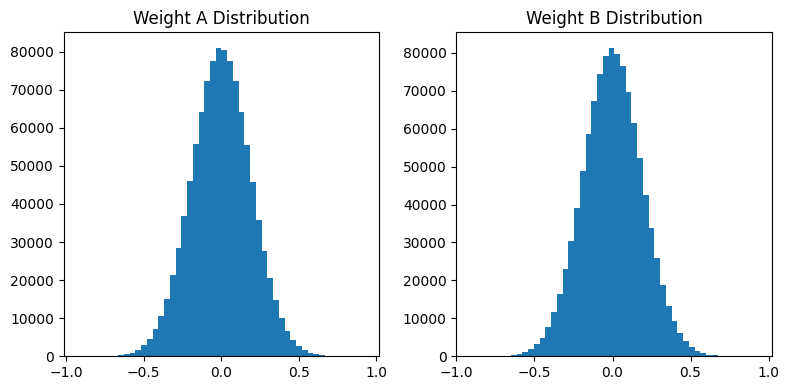

In [321]:
# Check weight distributions

fig, axes = plt.subplots(1, 2, figsize=(8, 4))

axes[0].hist(rbm.A.detach().cpu().flatten(), bins=50)
axes[0].set_title("Weight A Distribution")
axes[1].hist(rbm.B.detach().cpu().flatten(), bins=50)
axes[1].set_title("Weight B Distribution")

plt.tight_layout()
plt.show()

In [322]:
# Get weight matrices

Weight_A = rbm.A.detach().cpu()
Weight_B = rbm.B.detach().cpu()

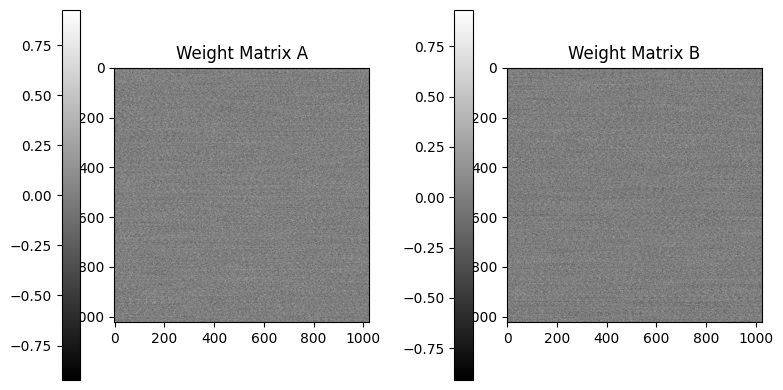

In [323]:
# Plot the full weight matrices

fig, axes = plt.subplots(1, 2, figsize=((8, 4)))

img = axes[0].imshow(Weight_A, cmap="gray")
axes[0].set_title("Weight Matrix A")
plt.colorbar(img, location='left')

img = axes[1].imshow(Weight_B, cmap="gray")
axes[1].set_title("Weight Matrix B")
plt.colorbar(img, location='left')

plt.tight_layout()
plt.show()

## Plot weight matrix A, B as filters (row vectors folded). 

## Only for XY Dataset.

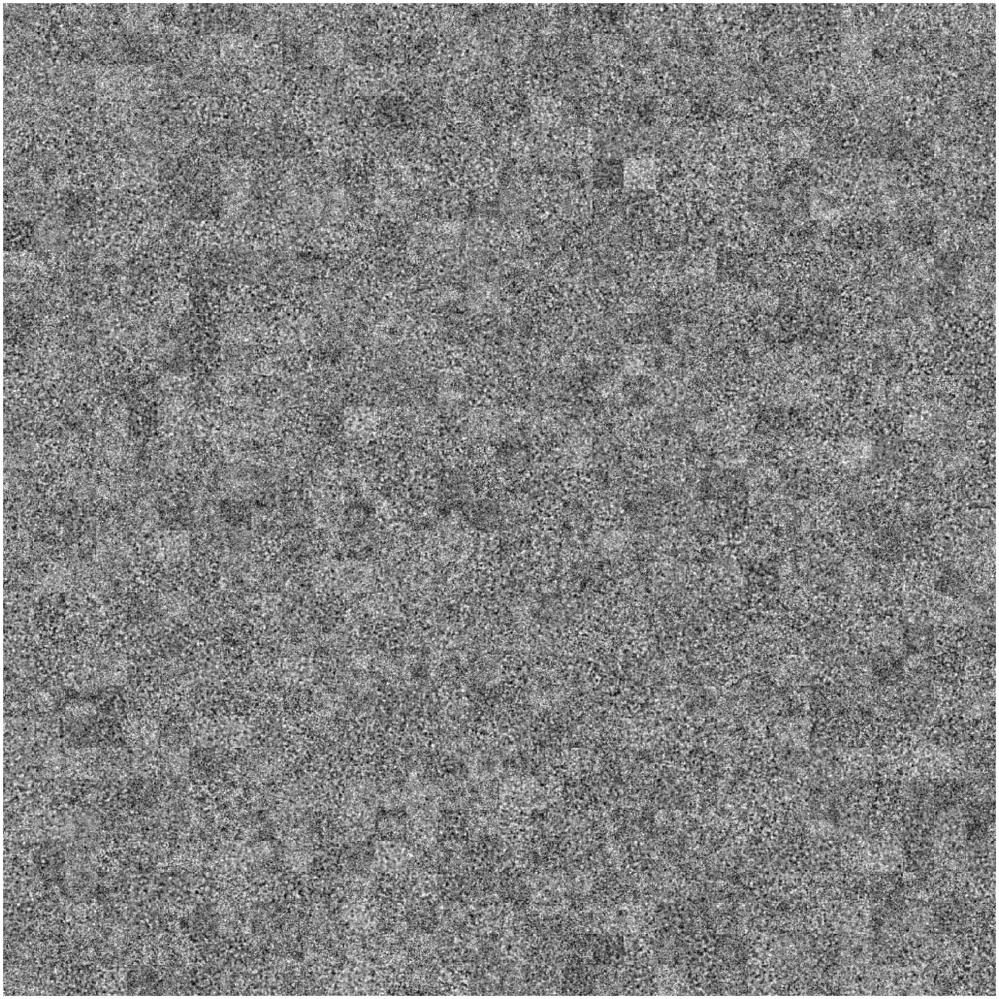

In [ ]:
# Visualize all weight filters as images: For Weight A.

# Adjust rows and cols based on n_hidden. E.g., 16x16 for 256, 32x16 for 512
rows = 32
cols = 32

fig = plt.figure(figsize=(cols, rows)) 
for i in range(rows * cols):
    ax = fig.add_subplot(rows, cols, i + 1)
    im = ax.imshow(Weight_A[i].view(p, p), cmap="gray", aspect='auto')
    ax.axis('off')
    
plt.subplots_adjust(wspace=0, hspace=0, left=0, right=1, top=1, bottom=0)
# cbar = fig.colorbar(im, orientation='horizontal')  #, fraction=0.05, pad=0.02)

plt.show()

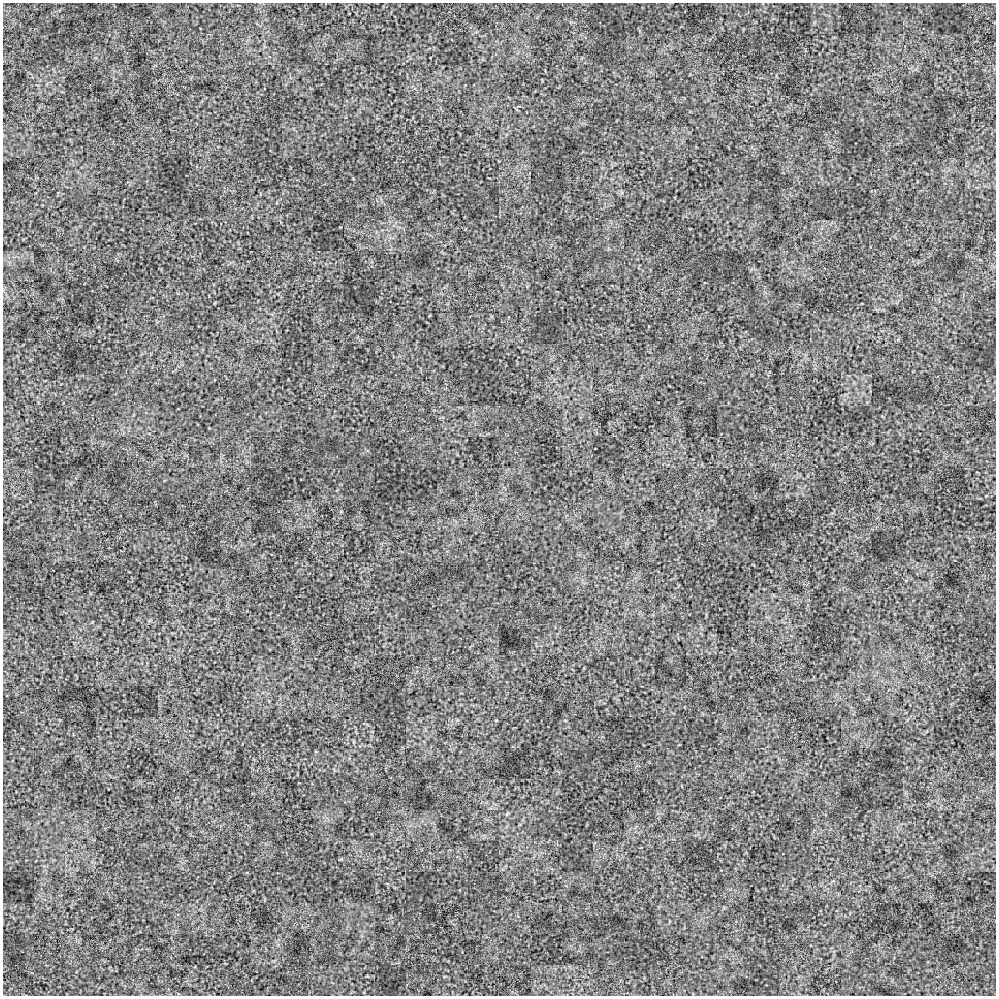

In [328]:
# Visualize all weight filters as images: For Weight B.

# Adjust rows and cols based on n_hidden. E.g., 16x16 for 256, 32x16 for 512
rows = 32
cols = 32

fig = plt.figure(figsize=(cols, rows)) 
for i in range(rows * cols):
    ax = fig.add_subplot(rows, cols, i + 1)
    im = ax.imshow(Weight_B[i].view(p, p), cmap="gray", aspect='auto')
    ax.axis('off')
    
plt.subplots_adjust(wspace=0, hspace=0, left=0, right=1, top=1, bottom=0)
# cbar = fig.colorbar(im, orientation='horizontal')  #, fraction=0.05, pad=0.02)

plt.show()

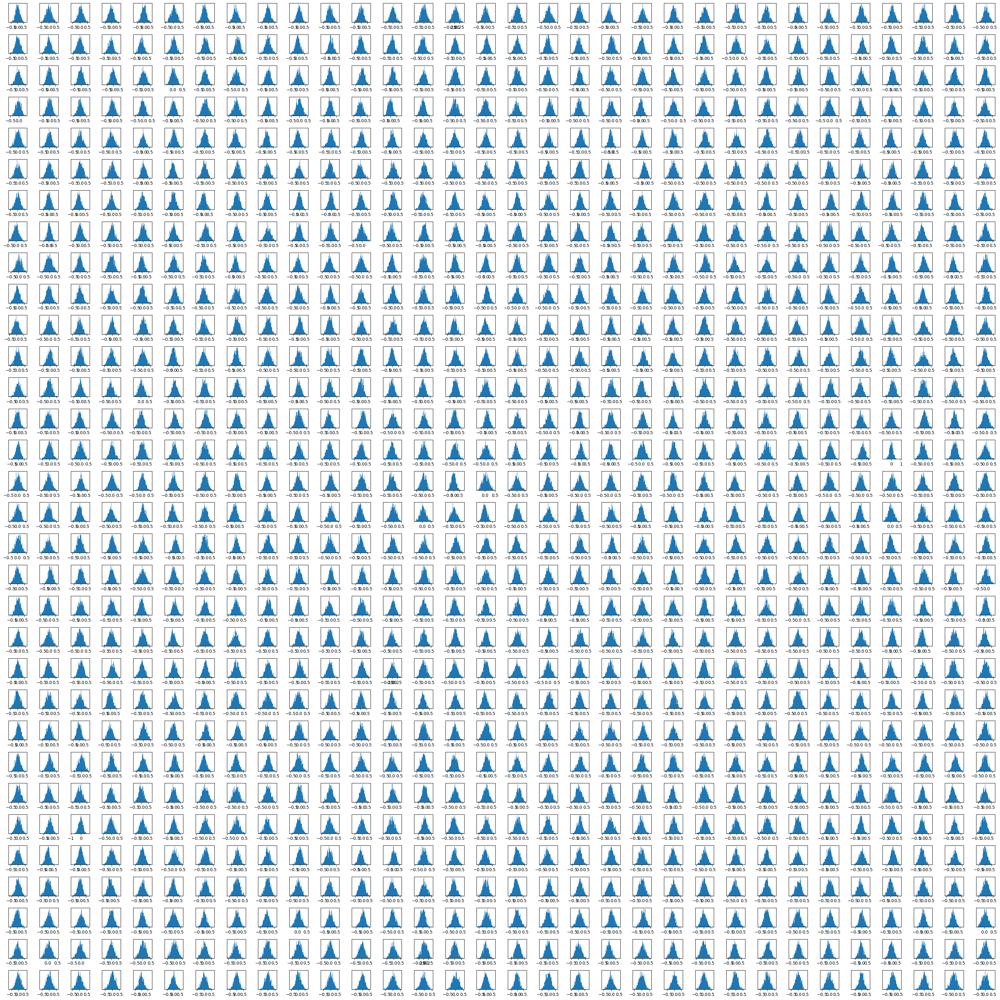

In [329]:
# Plot histograms of weight matrix filters: For Weight A.

fig = plt.figure(figsize=(cols, rows)) 
for i in range(rows * cols): 
    ax = fig.add_subplot(rows, cols, i + 1)
    ax.hist(Weight_A[i].detach().cpu().view(-1), bins=50)
    # ax.axis('off')
    # ax.set_xlim(-4,4)
    # ax.set_xticks([])
    ax.set_yticks([])
    
plt.tight_layout()
plt.show()

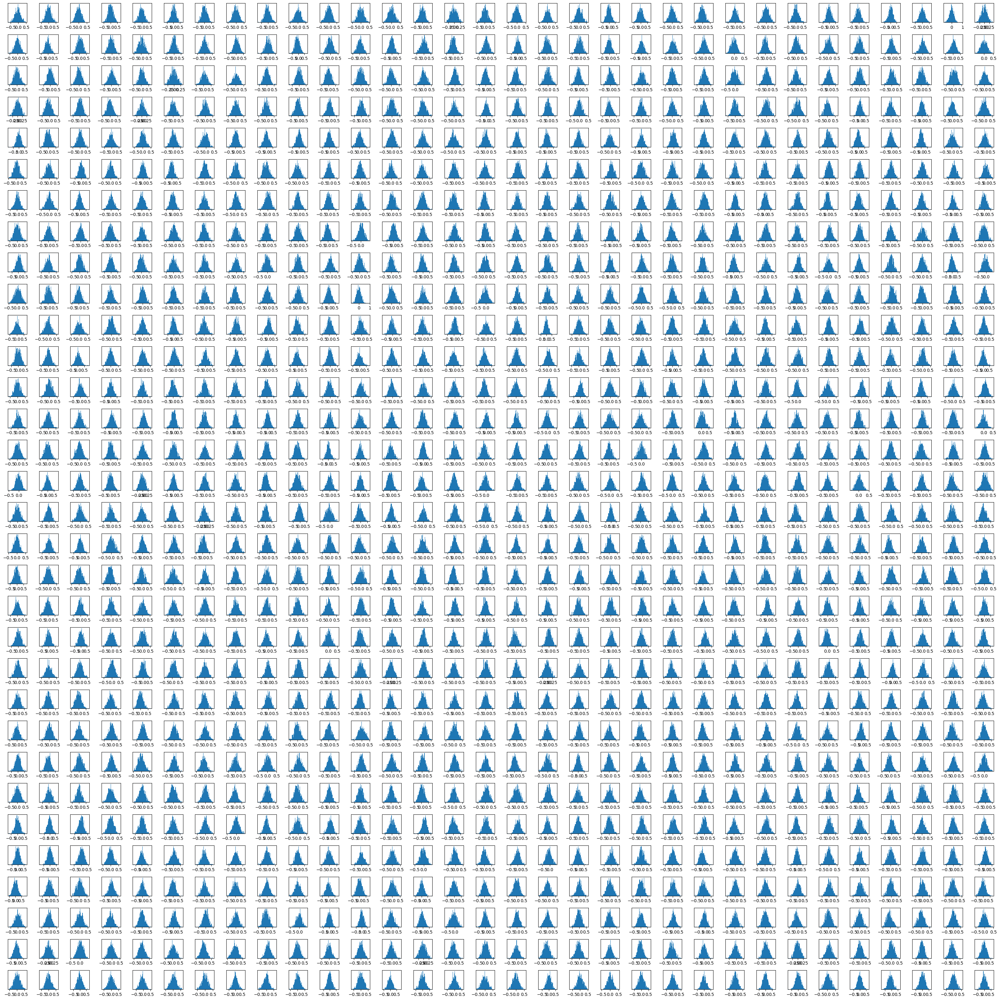

In [330]:
# Plot histograms of weight matrix filters: For Weight B.

fig = plt.figure(figsize=(cols, rows)) 
for i in range(rows * cols): 
    ax = fig.add_subplot(rows, cols, i + 1)
    ax.hist(Weight_B[i].detach().cpu().view(-1), bins=50)
    # ax.axis('off')
    # ax.set_xlim(-4,4)
    # ax.set_xticks([])
    ax.set_yticks([])
    
plt.tight_layout()
plt.show()

# The End